---
# What it 'CLAHE'?
---
## Contrast Limited Adaptive Histogram Equalization
---
### AHE >> Adaptive histogram equalization 
---
* the image is divided into small blocks called "tiles" (tileSize is 8x8 by default in OpenCV). Then each of these blocks are histogram equalized as usual.
---
### CL >> contrast limiting 
---
* If noise is there, it will be amplified. To avoid this, contrast limiting is applied. If any histogram bin is above the specified contrast limit (by default 40 in OpenCV), those pixels are clipped and distributed uniformly to other bins before applying histogram equalization.

---
# How it is compared to what we disscused in the lecture?
---
### normal histogram
---
* Consider an image whose pixel values are confined to some specific range of values only, you need to stretch this histogram to either ends

![histogram](./histlabfiles/histeq.png)

![histogram](./histlabfiles/histeq2.png)
* Histogram equalization is good when histogram of the image is confined to a particular region. It won't work good in places where there is large intensity variations where histogram covers a large region, ie both bright and dark pixels are present.

![histogram](./histlabfiles/histb.gif)

* as shown in the previous histogram there are two regions not one regon like the previous histogram

![histogram](./histlabfiles/clahe_1.jpg)

* in this image equalization the face information is lost bcz there is a big difference in the original image between the background and face 

* CLAHE ues small blocks called "tiles" and equalize it and so the background is equalized separately and the face is equalized separately.

![histogram](./histlabfiles/clahe_2.jpg)


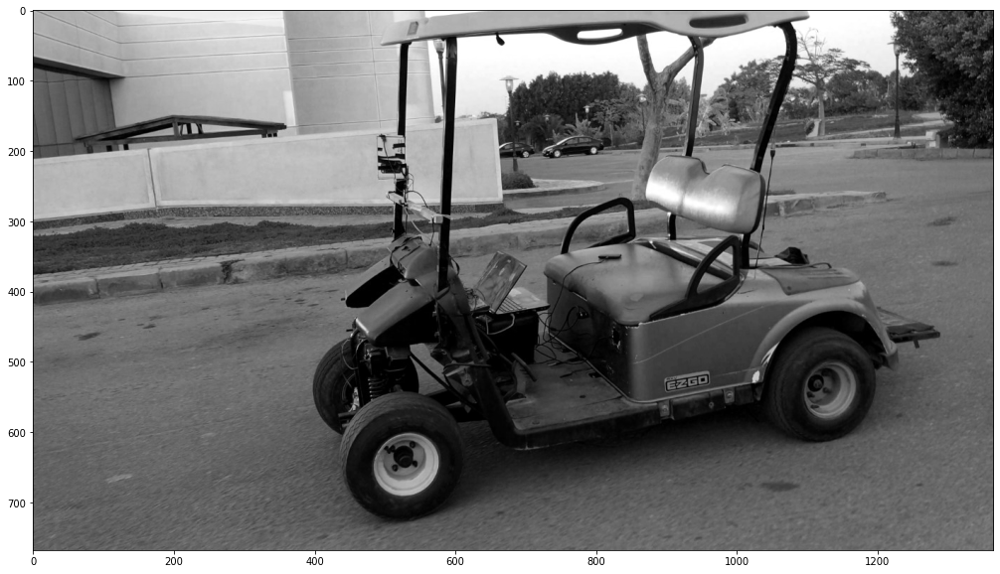

In [1]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
img = plt.imread("carkyo.jpg")
imgcopy = np.copy(img)
img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
plt.figure(figsize=(20,10))
plt.imshow(img,cmap="gray");

---
## hist of carkyo
---
* we can see from the histogram that the image isn't confined to samll region
* the normal histogram would result in over brightness in some regions

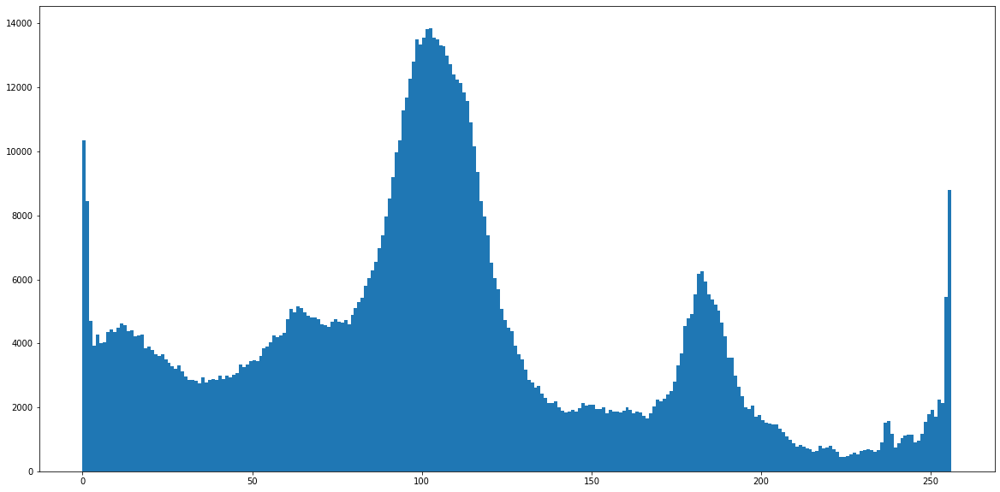

In [6]:
plt.figure(figsize=(20,10))
plt.hist(img.flatten(),256,[0,256]);

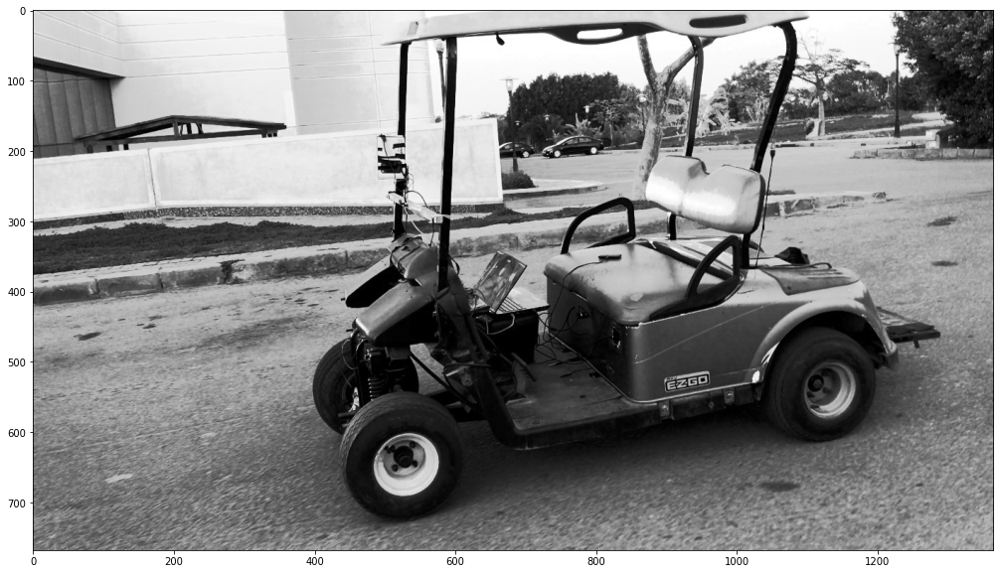

In [9]:
histeq = cv2.equalizeHist(img)
plt.figure(figsize=(20,10))
plt.imshow(histeq,cmap="gray");
# notice the iti building this is similar to the face in the explination

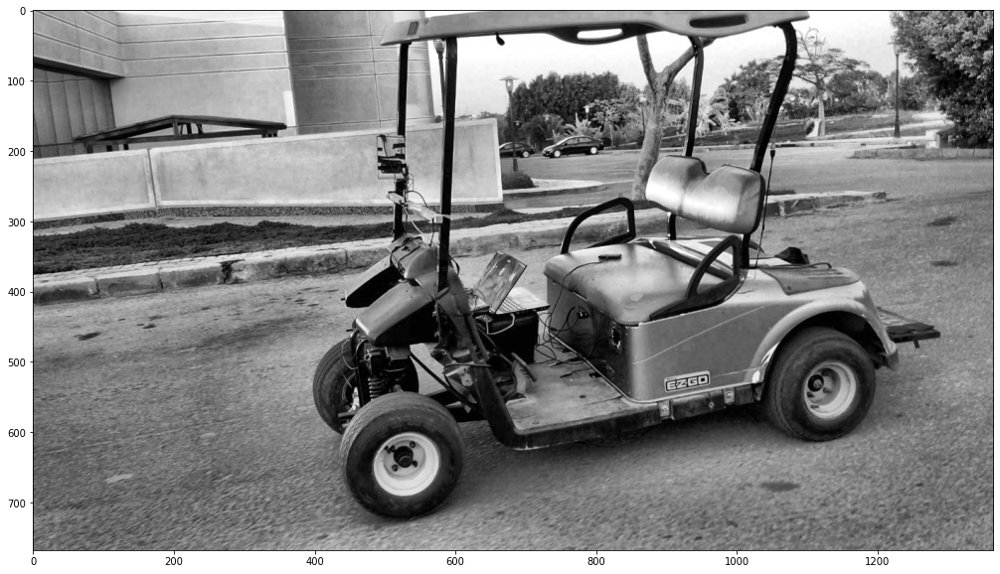

In [10]:
clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8,8))
cl1 = clahe.apply(img)
plt.figure(figsize=(20,10))
plt.imshow(cl1,cmap="gray");
# notice the iti building ,the over brightness is solved

In [2]:
# the effect of the title grid size 
def nothing(x):
    pass
cv2.namedWindow('Image')

cv2.createTrackbar('tileGridSize', 'Image', 1, 30, nothing)

while(1):
    tileGridSize = cv2.getTrackbarPos('tileGridSize','Image')
    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(tileGridSize,tileGridSize))
    cl1 = clahe.apply(img)
    cv2.imshow('Image', cl1)
    k = cv2.waitKey(1) & 0xFF
    if k == 'q':
        break
    
cv2.destroyAllWindows()

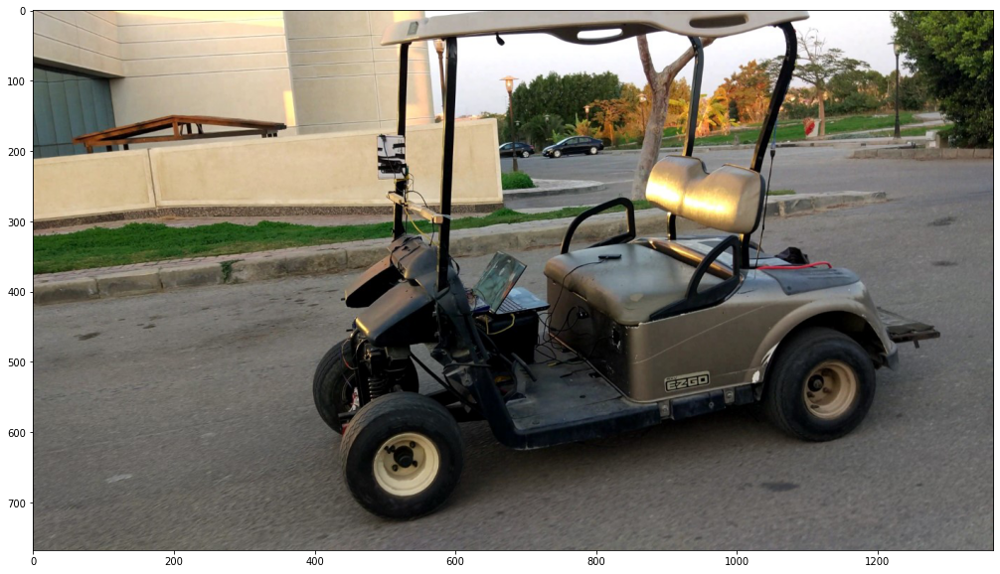

In [2]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
img = plt.imread("carkyo.jpg")
imgcopy = np.copy(img)
plt.figure(figsize=(20,10))
plt.imshow(img);

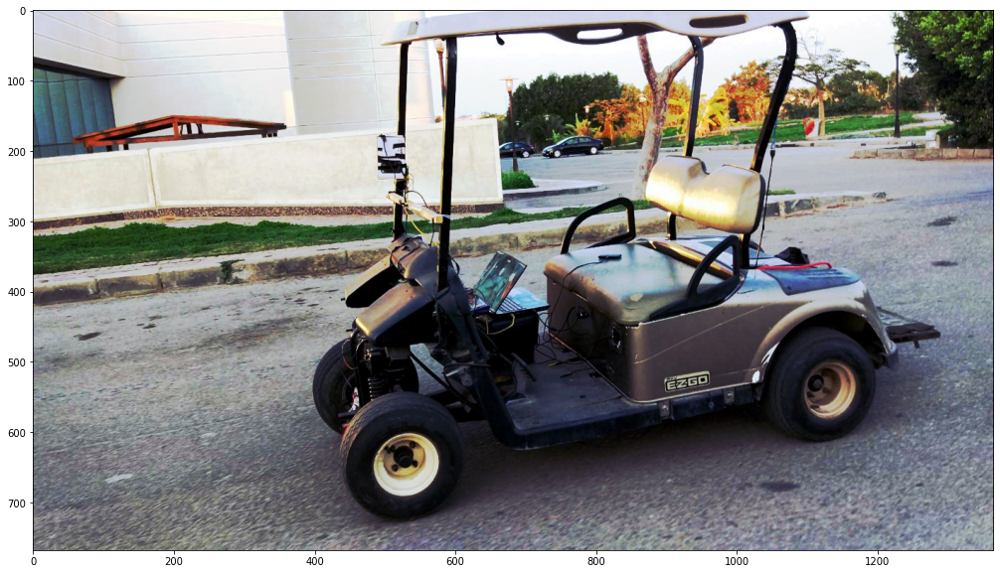

In [7]:
# the iti building is over bright
b, g, r = cv2.split(img)
beq = cv2.equalizeHist(b)
geq = cv2.equalizeHist(g)
req = cv2.equalizeHist(r)
imgEq = cv2.merge([beq, geq, req])
plt.figure(figsize=(20,10))
plt.imshow(imgEq);

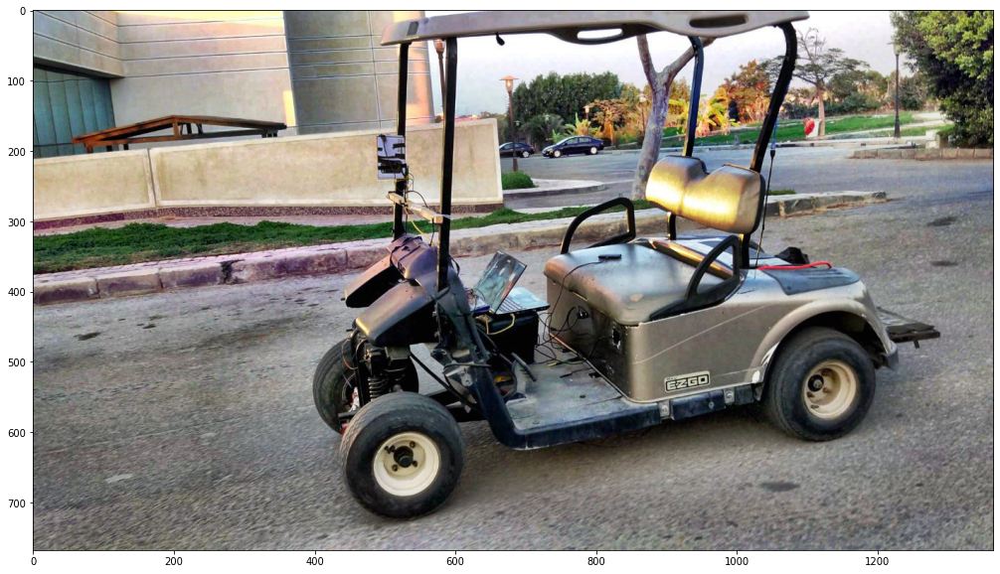

In [8]:
# the iti building over brightness is solved
b, g, r = cv2.split(img)
clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8,8))
clb = clahe.apply(b)
clg = clahe.apply(g)
clr = clahe.apply(r)
imgEq = cv2.merge([clb, clg, clr])
plt.figure(figsize=(20,10))
plt.imshow(imgEq);